In [1]:
# basics
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# preprocessing
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, PowerTransformer, OneHotEncoder, QuantileTransformer, quantile_transform
from sklearn.impute import SimpleImputer
import category_encoders as ce
from sklearn.compose import TransformedTargetRegressor

# statistics
from scipy import stats
from scipy.stats import skew, randint
from scipy.special import boxcox1p

# feature engineering
from sklearn.feature_selection import mutual_info_regression

# transformers and pipelines
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn import set_config

# algorithms
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import ElasticNet, Lasso, Ridge
from sklearn.svm import SVR

#model evaluation
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_validate
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, make_scorer
import optuna
from optuna.samplers import TPESampler
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice

#stacking
from sklearn.ensemble import StackingRegressor
from mlxtend.regressor import StackingCVRegressor

In [2]:
"""
    First look into out test and train datasets
"""

original_train_ds = pd.read_csv('train.csv')
original_test_ds = pd.read_csv('test.csv')

# reserved for pipeline
pipe_data = original_train_ds.copy()
pipe_test = original_test_ds.copy()

# use for preliminary analysis
train_df = original_train_ds.copy()
test_df = original_test_ds.copy()

# print(train_df.head())
print(test_df.describe().T)
print(train_df.describe(include='object').T.sort_values(by=['unique'], ascending=False))

                                count           mean            std  \
id                           250000.0  874999.500000   72168.927986   
Episode_Length_minutes       221264.0     419.298741  166854.502468   
Host_Popularity_percentage   250000.0      59.716491      22.880028   
Guest_Popularity_percentage  201168.0      52.192796      28.445034   
Number_of_Ads                250000.0       1.355852       4.274399   

                                   min        25%        50%        75%  \
id                           750000.00  812499.75  874999.50  937499.25   
Episode_Length_minutes            2.47      35.78      63.97      94.15   
Host_Popularity_percentage        2.49      39.25      59.90      79.39   
Guest_Popularity_percentage       0.00      28.32      53.36      76.56   
Number_of_Ads                     0.00       0.00       1.00       2.00   

                                     max  
id                             999999.00  
Episode_Length_minutes       7848626

In [3]:
missing = pd.DataFrame(train_df.isnull().sum().sort_values(ascending=False))
missing.columns = ["count"]
missing = missing.loc[(missing!=0).any(axis=1)]
missing["percent"] = missing[0:] / 750000
missing.style.background_gradient('viridis')

,count,percent
Guest_Popularity_percentage,146030,0.194707
Episode_Length_minutes,87093,0.116124
Number_of_Ads,1,0.000001


In [4]:
# drop id col
train_df = train_df.drop(columns=["id"])

In [5]:
# group features 

# Categorical (text) columns
categorical_features = [feature for feature in train_df.columns if
                    train_df[feature].dtype == "object"] 

# Split them into nominal and ordinal (ordered)
nominal_features = ["Episode_Title", "Podcast_Name", "Genre", "Publication_Time"]
ordinal_features = ["Publication_Day", "Episode_Sentiment"]  # ordered variables

# Numerical columns
numerical_features = ["Episode_Length_minutes", "Host_Popularity_percentage", "Guest_Popularity_percentage", "Number_of_Ads"]

# Split numerical into discrete and continuous
discrete_numerical_features = ["Number_of_Ads"]
continuous_numerical_features = ["Episode_Length_minutes", "Host_Popularity_percentage", "Guest_Popularity_percentage"]

# Assertions (optional safety check)
assert categorical_features.sort() == (nominal_features + ordinal_features).sort(), "Problemo"
assert numerical_features.sort() == (discrete_numerical_features + continuous_numerical_features).sort(), "Problemo"

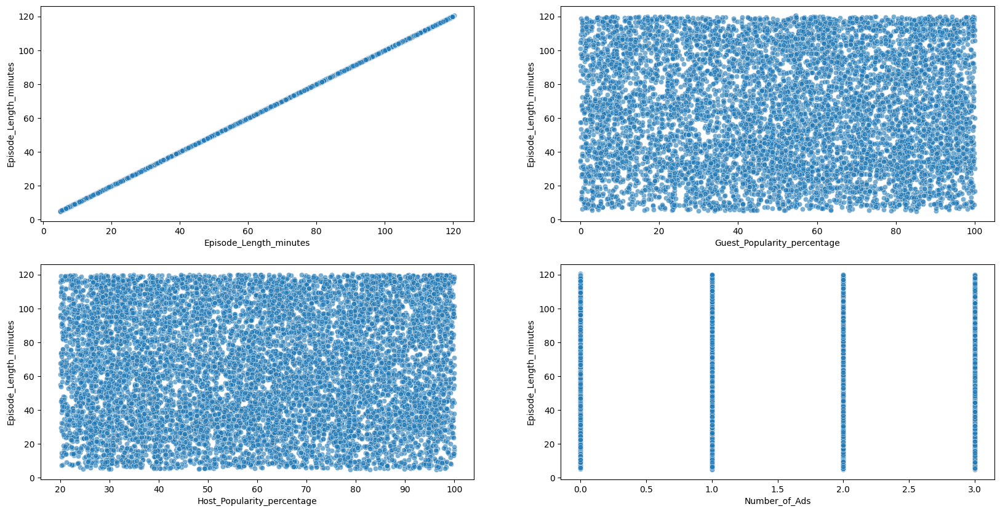

In [6]:
# EDA
sample_df = train_df.sample(n=12000, random_state=42)  # 5k rows is plenty
fig, ax = plt.subplots(2, 2, figsize=(20, 10))

for var, subplot in zip(numerical_features, ax.flatten()):
    sns.scatterplot(
        x=var, 
        y='Episode_Length_minutes', 
        data=sample_df, 
        ax=subplot,
        alpha=0.6
    )


In [7]:
# above do not tell us nothing, lets create couple of our own features to see whats up

train_df['host_guest_popularity_difference'] = train_df['Host_Popularity_percentage'] - train_df['Guest_Popularity_percentage']
train_df['host_guest_popularity_ratio'] = (
    train_df['Host_Popularity_percentage'] / (train_df['Guest_Popularity_percentage'] + 1e-5)
)
train_df['ads_per_minute'] = (
    train_df['Number_of_Ads'] / (train_df['Episode_Length_minutes'] + 1e-5)
)

train_df['popularity_sum'] = train_df['Host_Popularity_percentage'] + train_df['Guest_Popularity_percentage']
train_df['popularity_mean'] = train_df['popularity_sum'] / 2 + 1e-5
train_df['popularity_product'] = train_df['Host_Popularity_percentage'] * train_df['Guest_Popularity_percentage']
train_df['popularity_ratio'] = train_df['Host_Popularity_percentage'] / train_df['Guest_Popularity_percentage']

train_df['ads_per_host_popularity'] = train_df['Number_of_Ads'] / train_df['Host_Popularity_percentage'] + 1e-5
train_df['ads_per_guest_popularity'] = train_df['Number_of_Ads'] / train_df['Guest_Popularity_percentage'] + 1e-5

train_df['minutes_per_ad'] = train_df['Episode_Length_minutes'] / train_df['Number_of_Ads'] + 1e-5

train_df['host_popularity_per_minute'] = train_df['Host_Popularity_percentage'] / train_df['Episode_Length_minutes'] + 1e-5
train_df['guest_popularity_per_minute'] = train_df['Guest_Popularity_percentage'] / train_df['Episode_Length_minutes'] + 1e-5
train_df['popularity_sum_per_minute'] = train_df['popularity_sum'] / train_df['Episode_Length_minutes'] + 1e-5


numerical_features = ["Episode_Length_minutes", 
                      "Host_Popularity_percentage", 
                      "Guest_Popularity_percentage", 
                      "Number_of_Ads", 
                      'host_guest_popularity_difference', 
                      'host_guest_popularity_ratio',
                     'ads_per_minute',
                     'popularity_sum',
                     'popularity_mean',
                     'popularity_product',
                     'popularity_ratio',
                     'ads_per_host_popularity',
                     'ads_per_guest_popularity',
                     'minutes_per_ad',
                     'host_popularity_per_minute',
                     'guest_popularity_per_minute',
                     'popularity_sum_per_minute']


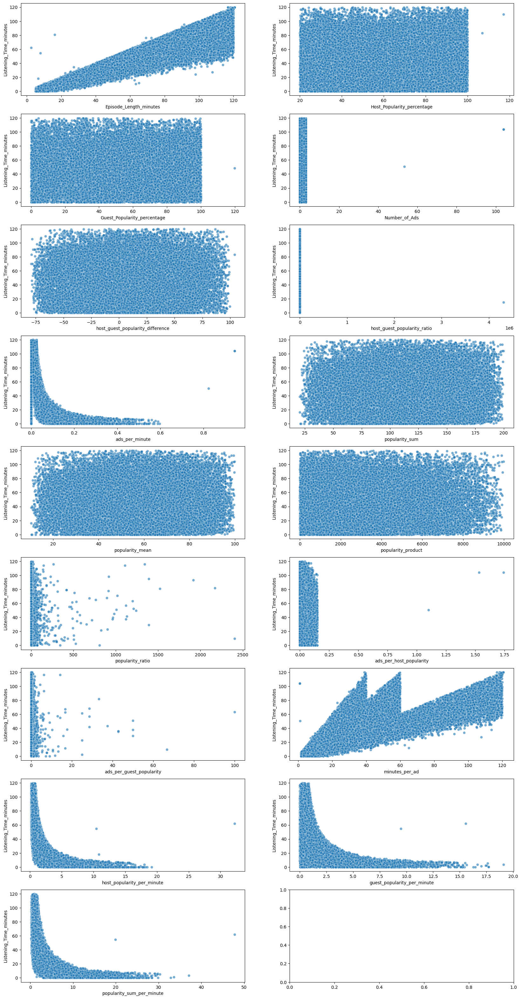

In [8]:
# EDA
sample_df = train_df.sample(n=50000, random_state=42)  # 5k rows is plenty
fig, ax = plt.subplots(9, 2, figsize=(20, 40))

for var, subplot in zip(numerical_features, ax.flatten()):
    sns.scatterplot(
        x=var, 
        y='Listening_Time_minutes', 
        data=sample_df, 
        ax=subplot,
        alpha=0.6
    )

In [9]:
# drop outliers

train_df = train_df.drop(train_df[(train_df['Listening_Time_minutes'] > train_df['Episode_Length_minutes'])].index)
train_df = train_df.drop(train_df[(train_df['Number_of_Ads'] > 3)].index)
train_df = train_df.drop(train_df[(train_df['Guest_Popularity_percentage'] > 100)].index)
train_df = train_df.drop(train_df[(train_df['Host_Popularity_percentage'] > 100)].index)
train_df = train_df.drop(train_df[(train_df['popularity_ratio'] > 2000)].index)



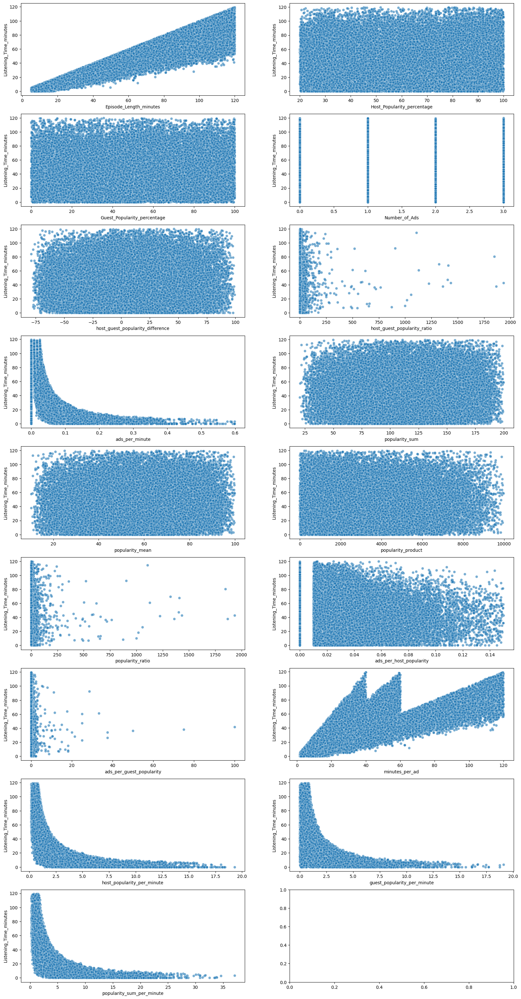

In [10]:
# repeat EDA
# EDA
sample_df = train_df.sample(n=50000, random_state=42)  # 5k rows is plenty
fig, ax = plt.subplots(9, 2, figsize=(20, 40))

for var, subplot in zip(numerical_features, ax.flatten()):
    sns.scatterplot(
        x=var, 
        y='Listening_Time_minutes', 
        data=sample_df, 
        ax=subplot,
        alpha=0.6
    )

In [11]:
y = train_df['Listening_Time_minutes']

<Axes: >

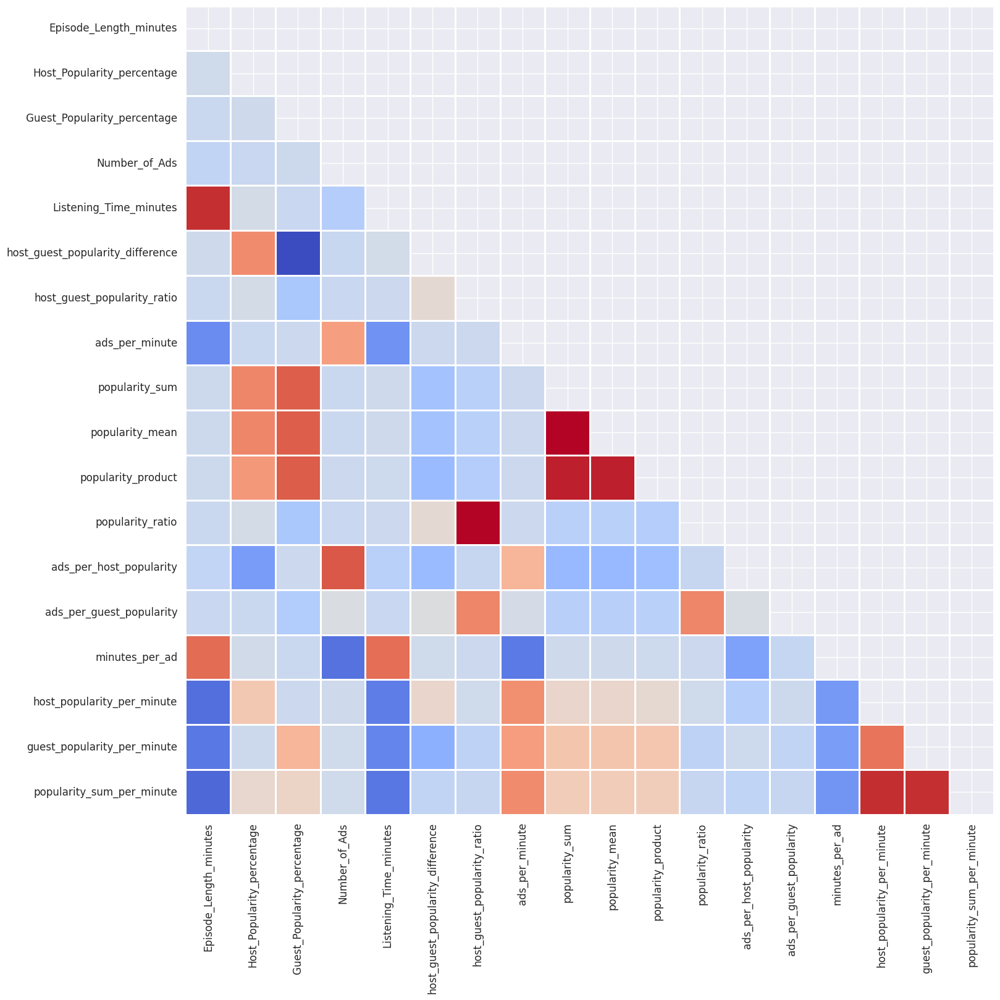

In [12]:
# Display correlations between numerical features and saleprice on heatmap.

# Wybieramy tylko kolumny numeryczne do policzenia korelacji
numerical_cols_for_corr = train_df.select_dtypes(include=np.number).columns.tolist()
correlation_train = train_df[numerical_cols_for_corr].corr()

# Poprawione tworzenie maski dla górnego trójkąta
mask = np.triu(correlation_train.corr())

sns.set_theme(font_scale=1.1)
plt.figure(figsize=(17, 17))
sns.heatmap(correlation_train,
            annot=False,  # Adnotacje wyłączone dla czytelności
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)


In [13]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 747292 entries, 0 to 749999
Data columns (total 24 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   Podcast_Name                      747292 non-null  object 
 1   Episode_Title                     747292 non-null  object 
 2   Episode_Length_minutes            660213 non-null  float64
 3   Genre                             747292 non-null  object 
 4   Host_Popularity_percentage        747292 non-null  float64
 5   Publication_Day                   747292 non-null  object 
 6   Publication_Time                  747292 non-null  object 
 7   Guest_Popularity_percentage       601751 non-null  float64
 8   Number_of_Ads                     747291 non-null  float64
 9   Episode_Sentiment                 747292 non-null  object 
 10  Listening_Time_minutes            747292 non-null  float64
 11  host_guest_popularity_difference  601751 non-null  float6

In [14]:
mutual_df = train_df[numerical_features]
mutual_df_clean = mutual_df.replace([np.inf, -np.inf], np.nan).fillna(0)
mutual_info = mutual_info_regression(mutual_df_clean, y, random_state=1)

mutual_info = pd.Series(mutual_info)
mutual_info.index = mutual_df.columns
pd.DataFrame(mutual_info.sort_values(ascending=False), columns = ["Numerical_Feature_MI"] ).style.background_gradient("cool")

,Numerical_Feature_MI
Episode_Length_minutes,2.032731
ads_per_minute,1.097291
minutes_per_ad,1.051119
host_popularity_per_minute,0.832367
Host_Popularity_percentage,0.762937
Guest_Popularity_percentage,0.642359
guest_popularity_per_minute,0.579035
popularity_sum_per_minute,0.551845
ads_per_guest_popularity,0.512278
ads_per_host_popularity,0.500113


In [15]:
champion_features = ['Episode_Length_minutes',
                     'Number_of_Ads',
                     'Host_Popularity_percentage',
                     'Guest_Popularity_percentage',
                     'popularity_product',
                     'host_guest_popularity_difference']

In [39]:
# Baseline: LightGBM na champion_features z metryk05 RMSE (minuty)
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd
import lightgbm as lgb
import matplotlib.pyplot as plt

# listening_ratio (na wszelki wypadek obliczamy tutaj)
eps = 1e-9
train_df['listening_ratio'] = (
    train_df['Listening_Time_minutes'] / train_df['Episode_Length_minutes'].clip(lower=eps)
).clip(0, 1)

champion_features = [
    'Episode_Length_minutes',
    'Number_of_Ads',
    'Host_Popularity_percentage',
    'Guest_Popularity_percentage',
    'popularity_product',
    'host_guest_popularity_difference'
]

# Usuwamy wiersze bez kluczowych informacji
work_df = train_df.dropna(subset=['Episode_Length_minutes', 'Listening_Time_minutes'])
X = work_df[champion_features].copy()
y = work_df['Listening_Time_minutes'].copy()

# Imputacja median05
imputer = SimpleImputer(strategy='median')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

# Train/val split
X_train, X_val, y_train, y_val = train_test_split(X_imputed, y, test_size=0.2, random_state=42)

estimators = [400]

leaves = [35]
learning_rates = [0.2]

for n_estimators in estimators:
    for n_leaves in leaves:
        for l_rate in learning_rates:
            model = lgb.LGBMRegressor(n_estimators=n_estimators, num_leaves=n_leaves, random_state=42, learning_rate=l_rate)
            model.fit(
                X_train, y_train,
                eval_set=[(X_val, y_val)],
                callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=False)]
            )
            # Model przewiduje MINUTY (bo y = Listening_Time_minutes)
            pred_minutes = model.predict(X_val)
            L = X_val['Episode_Length_minutes'].values
            # Clamp: predykcja nie może przekroczyć długości odcinka
            pred_minutes_clamped = np.clip(pred_minutes, 0, L)
            true_minutes = y_val.values  # To są już minuty, nie mnożymy!
            rmse = np.sqrt(mean_squared_error(true_minutes, pred_minutes_clamped))
            print("--------------------------------")
            print(f"for {n_estimators} estimators and {n_leaves} leaves and {l_rate} learning rate Baseline (champion_features) RMSE [min]: {rmse:.4f}")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1279
[LightGBM] [Info] Number of data points in the train set: 528170, number of used features: 6
[LightGBM] [Info] Start training from score 45.720422
--------------------------------
for 400 estimators and 35 leaves and 0.2 learning rate Baseline (champion_features) RMSE [min]: 10.3124


In [ ]:
# lets add ordinal features ordinal_features
features = champion_features + ordinal_features

work_df = train_df[features]

work_df = work_df.dropna()

# mapping publication_day to ordinal
work_df['Publication_Day'] = work_df['Publication_Day'].map({'Monday': 0, 'Tuesday': 1, 'Wednesday': 2, 'Thursday': 3, 'Friday': 4, 'Saturday': 5, 'Sunday': 6})

# mapping episode_sentiment to ordinal
work_df['Episode_Sentiment'] = work_df['Episode_Sentiment'].map({'Positive': 0, 'Negative': 1, 'Neutral': 2})

work_df.info()

X = work_df.drop(columns=['Listening_Time_minutes'])
y = work_df['Listening_Time_minutes']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

model = lgb.LGBMRegressor(n_estimators=400, num_leaves=35, random_state=42, learning_rate=0.2)
model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=False)]
)
pred_ratio = model.predict(X_val)
L = X_val['Episode_Length_minutes'].values
pred_minutes = np.clip(pred_ratio * L, 0, L)
true_minutes = y_val.values * L
rmse = np.sqrt(mean_squared_error(true_minutes, pred_minutes))
print("--------------------------------")
print(f"for {n_estimators} estimators and {n_leaves} leaves and {l_rate} learning rate Baseline (champion_features) RMSE [min]: {rmse:.4f}")
# rmse = 10.33





<class 'pandas.core.frame.DataFrame'>
Index: 536843 entries, 1 to 749999
Data columns (total 8 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   Episode_Length_minutes            536843 non-null  float64
 1   Number_of_Ads                     536843 non-null  float64
 2   Host_Popularity_percentage        536843 non-null  float64
 3   Guest_Popularity_percentage       536843 non-null  float64
 4   popularity_product                536843 non-null  float64
 5   host_guest_popularity_difference  536843 non-null  float64
 6   Publication_Day                   536843 non-null  int64  
 7   Episode_Sentiment                 536843 non-null  int64  
dtypes: float64(6), int64(2)
memory usage: 36.9 MB


KeyError: "['Listening_Time_minutes'] not found in axis"